# U-Net Hiding Network, BatchNorm, SiLU Activation, Perceptual Loss, Two Back Propagations

In [1]:
import os
import torch
import torchvision
from torch import nn
from torch.utils.data import DataLoader
from torchvision import datasets

In [2]:
try:
    from torchinfo import summary
except ImportError:
    import subprocess
    subprocess.check_call(["pip", "install", "torchinfo"])
    from torchinfo import summary

try:
    import torchmetrics
except ImportError:
    import subprocess
    subprocess.check_call(["pip", "install", "torchmetrics"])
    import torchmetrics


In [3]:
repo_url = "https://raw.githubusercontent.com/vardanskamra/Deep-Multimedia-Steganography/main"
file = "helper_functions.py"
file_url = f"{repo_url}/{file}"
os.system(f"curl -s -f {file_url} -o {file}")
print("Downloaded all file successfully!")

Downloaded all file successfully!


In [4]:
from helper_functions import (train, 
    test,
    random_attack, 
    apply_attacks,
    plot_metrics,
    visualize_images)
from helper_functions import transform


In [5]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [6]:
dataset = datasets.Caltech256(root='./data', download=True, transform=transform)

# Using x% of the dataset
subset_size = int(1 * len(dataset))  
train_size = int(0.8 * subset_size)  
test_size = subset_size - train_size  

subset_dataset, _ = torch.utils.data.random_split(dataset, [subset_size, len(dataset) - subset_size])

train_dataset, test_dataset = torch.utils.data.random_split(subset_dataset, [train_size, test_size])

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=os.cpu_count(), drop_last=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, drop_last=True)

Files already downloaded and verified


In [7]:
print(f"Train Dataset Length: {len(train_dataset)}")
print(f"Test Dataset Length: {len(test_dataset)}")
print(f"Train DataLoader Length: {len(train_loader)}")
print(f"Test DataLoader Length: {len(test_loader)}")

sample, label = next(iter(train_loader))
print(f"Sample Shape: {sample.shape}")
print(f"Label Shape: {label.shape}")

Train Dataset Length: 24485
Test Dataset Length: 6122
Train DataLoader Length: 765
Test DataLoader Length: 191
Sample Shape: torch.Size([32, 3, 256, 256])
Label Shape: torch.Size([32])


In [8]:
class PrepNetwork(nn.Module):
    def __init__(self):
        super().__init__()
        # Initial multi-scale processing
        self.initialP3 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.SiLU(),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.SiLU(),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.SiLU(),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.SiLU(),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.SiLU())
        
        self.initialP5 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=5, padding=2),
            nn.BatchNorm2d(64),
            nn.SiLU(),
            nn.Conv2d(64, 64, kernel_size=5, padding=2),
            nn.BatchNorm2d(64),
            nn.SiLU(),
            nn.Conv2d(64, 64, kernel_size=5, padding=2),
            nn.BatchNorm2d(64),
            nn.SiLU(),
            nn.Conv2d(64, 64, kernel_size=5, padding=2),
            nn.BatchNorm2d(64),
            nn.SiLU(),
            nn.Conv2d(64, 64, kernel_size=5, padding=2),
            nn.BatchNorm2d(64),
            nn.SiLU())
        
        self.initialP7 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=7, padding=3),
            nn.BatchNorm2d(64),
            nn.SiLU(),
            nn.Conv2d(64, 64, kernel_size=7, padding=3),
            nn.BatchNorm2d(64),
            nn.SiLU(),
            nn.Conv2d(64, 64, kernel_size=7, padding=3),
            nn.BatchNorm2d(64),
            nn.SiLU(),
            nn.Conv2d(64, 64, kernel_size=7, padding=3),
            nn.BatchNorm2d(64),
            nn.SiLU(),
            nn.Conv2d(64, 64, kernel_size=7, padding=3),
            nn.BatchNorm2d(64),
            nn.SiLU())

        # Upsampling and final processing
        self.upscale = nn.Sequential(
            nn.ConvTranspose2d(192, 150, kernel_size=4, stride=2, padding=1),  # 128->256
            nn.SiLU(),
            nn.Conv2d(150, 150, 3, padding=1),
            nn.SiLU()
        )

    def forward(self, p):
        p1 = self.initialP3(p)
        p2 = self.initialP5(p)
        p3 = self.initialP7(p)
        combined = torch.cat((p1, p2, p3), 1)
        return self.upscale(combined)


In [9]:
class HidingNetwork(nn.Module):
    def __init__(self):
        super(HidingNetwork, self).__init__()
        # Encoder
        self.enc1 = self.conv_block(153, 32)   # output: 32 channels, same spatial dims
        self.pool1 = nn.MaxPool2d(2)            # downsample by factor of 2

        self.enc2 = self.conv_block(32, 64)     # output: 64 channels
        self.pool2 = nn.MaxPool2d(2)

        self.enc3 = self.conv_block(64, 128)    # output: 128 channels
        self.pool3 = nn.MaxPool2d(2)

        self.enc4 = self.conv_block(128, 256)   # output: 256 channels
        self.pool4 = nn.MaxPool2d(2)

        # Bottleneck
        self.bottleneck = self.conv_block(256, 256)

        # Decoder
        self.upconv4 = nn.ConvTranspose2d(256, 256, kernel_size=2, stride=2)
        self.dec4 = self.conv_block(256 + 256, 128)  # concatenate with enc4

        self.upconv3 = nn.ConvTranspose2d(128, 128, kernel_size=2, stride=2)
        self.dec3 = self.conv_block(128 + 128, 64)

        self.upconv2 = nn.ConvTranspose2d(64, 64, kernel_size=2, stride=2)
        self.dec2 = self.conv_block(64 + 64, 32)

        self.upconv1 = nn.ConvTranspose2d(32, 32, kernel_size=2, stride=2)
        self.dec1 = self.conv_block(32 + 32, 16)

        self.final_conv = nn.Conv2d(16, 3, kernel_size=1)
        self.sigmoid = nn.Sigmoid()

    def conv_block(self, in_channels, out_channels):
        block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.SiLU(),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.SiLU()
        )
        return block

    def forward(self, cover, secret_prepared):
        # Concatenate cover and secret_prepared along channel dimension.
        x = torch.cat([cover, secret_prepared], dim=1)

        # Encoder
        e1 = self.enc1(x)   # shape: [B, 32, H, W]
        p1 = self.pool1(e1) # shape: [B, 32, H/2, W/2]

        e2 = self.enc2(p1)  # shape: [B, 64, H/2, W/2]
        p2 = self.pool2(e2) # shape: [B, 64, H/4, W/4]

        e3 = self.enc3(p2)  # shape: [B, 128, H/4, W/4]
        p3 = self.pool3(e3) # shape: [B, 128, H/8, W/8]

        e4 = self.enc4(p3)  # shape: [B, 256, H/8, W/8]
        p4 = self.pool4(e4) # shape: [B, 256, H/16, W/16]

        # Bottleneck
        b = self.bottleneck(p4)  # shape: [B, 256, H/16, W/16]

        # Decoder
        d4 = self.upconv4(b)     # shape: [B, 256, H/8, W/8]
        d4 = torch.cat([d4, e4], dim=1)  # Skip connection from encoder stage 4
        d4 = self.dec4(d4)       # shape: [B, 128, H/8, W/8]

        d3 = self.upconv3(d4)    # shape: [B, 128, H/4, W/4]
        d3 = torch.cat([d3, e3], dim=1)
        d3 = self.dec3(d3)       # shape: [B, 64, H/4, W/4]

        d2 = self.upconv2(d3)    # shape: [B, 64, H/2, W/2]
        d2 = torch.cat([d2, e2], dim=1)
        d2 = self.dec2(d2)       # shape: [B, 32, H/2, W/2]

        d1 = self.upconv1(d2)    # shape: [B, 32, H, W]
        d1 = torch.cat([d1, e1], dim=1)
        d1 = self.dec1(d1)       # shape: [B, 16, H, W]

        out = self.final_conv(d1)
        out = self.sigmoid(out)
        return out

In [10]:
class RevealNetwork(nn.Module):
    def __init__(self):
        super().__init__()
        # Downsampling layers with stride=2
        self.initialR3 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=2, padding=1),  # 256->128
            nn.BatchNorm2d(64),
            nn.SiLU(),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.SiLU(),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.SiLU(),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.SiLU(),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.SiLU(),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.SiLU())
        
        self.initialR5 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=5, stride=2, padding=2),  # 256->128
            nn.BatchNorm2d(64),
            nn.SiLU(),
            nn.Conv2d(64, 64, kernel_size=5, padding=2),
            nn.BatchNorm2d(64),
            nn.SiLU(),
            nn.Conv2d(64, 64, kernel_size=5, padding=2),
            nn.BatchNorm2d(64),
            nn.SiLU(),
            nn.Conv2d(64, 64, kernel_size=5, padding=2),
            nn.BatchNorm2d(64),
            nn.SiLU(),
            nn.Conv2d(64, 64, kernel_size=5, padding=2),
            nn.BatchNorm2d(64),
            nn.SiLU(),
            nn.Conv2d(64, 64, kernel_size=5, padding=2),
            nn.BatchNorm2d(64),
            nn.SiLU())
        
        self.initialR7 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3),  # 256->128
            nn.BatchNorm2d(64),
            nn.SiLU(),
            nn.Conv2d(64, 64, kernel_size=7, padding=3),
            nn.BatchNorm2d(64),
            nn.SiLU(),
            nn.Conv2d(64, 64, kernel_size=7, padding=3),
            nn.BatchNorm2d(64),
            nn.SiLU(),
            nn.Conv2d(64, 64, kernel_size=7, padding=3),
            nn.BatchNorm2d(64),
            nn.SiLU(),
            nn.Conv2d(64, 64, kernel_size=7, padding=3),
            nn.BatchNorm2d(64),
            nn.SiLU(),
            nn.Conv2d(64, 64, kernel_size=7, padding=3),
            nn.BatchNorm2d(64),
            nn.SiLU())

        # Final processing at 128x128 resolution
        self.finalR = nn.Sequential(
            nn.Conv2d(192, 64, kernel_size=1),
            nn.SiLU(),
            nn.Conv2d(64 ,3, kernel_size=1),
            nn.Sigmoid())

    def forward(self, r):
        r1 = self.initialR3(r)
        r2 = self.initialR5(r)
        r3 = self.initialR7(r)
        combined = torch.cat((r1, r2, r3), 1)
        return self.finalR(combined)

In [11]:
print(f"Device: {device}")
prep_net = nn.DataParallel(PrepNetwork()).to(device)
hide_net = nn.DataParallel(HidingNetwork()).to(device)
reveal_net = nn.DataParallel(RevealNetwork()).to(device)

Device: cuda


In [12]:
print("PrepNetwork Summary:")
print(summary(prep_net, input_size=(16, 3, 128, 128)))

cover = torch.randn(16, 3, 256, 256).to(device)
secret_prepared = torch.randn(16, 150, 256, 256).to(device)

print("\nHidingNetwork Summary:")
print(summary(hide_net, input_data=[cover, secret_prepared])) # 6 channels (cover + secret_prepared)

print("\nRevealNetwork Summary:")
print(summary(reveal_net, input_size=(16, 3, 256, 256)))

PrepNetwork Summary:
Layer (type:depth-idx)                   Output Shape              Param #
DataParallel                             [16, 150, 256, 256]       --
├─PrepNetwork: 1-1                       [8, 150, 256, 256]        2,042,288
├─PrepNetwork: 1-4                       --                        (recursive)
│    └─Sequential: 2-1                   [8, 64, 128, 128]         150,144
│    └─Sequential: 2-4                   --                        (recursive)
│    │    └─Conv2d: 3-1                  [8, 64, 128, 128]         1,792
├─PrepNetwork: 1-3                       [8, 150, 256, 256]        --
├─PrepNetwork: 1-4                       --                        (recursive)
│    └─Sequential: 2-3                   [8, 64, 128, 128]         --
│    └─Sequential: 2-4                   --                        (recursive)
│    │    └─Conv2d: 3-2                  [8, 64, 128, 128]         --
│    │    └─BatchNorm2d: 3-3             [8, 64, 128, 128]         128
│    │    └─

In [13]:
optimizer_prep_hide = torch.optim.Adam(list(prep_net.parameters()) + list(hide_net.parameters()), lr=0.001)
optimizer_reveal = torch.optim.Adam(reveal_net.parameters(), lr=0.001)

In [14]:
checkpoint = torch.load('/kaggle/working/model_checkpoint.pth', map_location=device)
# checkpoint = torch.load('/kaggle/input/checkpoint_pretrained/pytorch/default/1/model_checkpoint.pth', map_location=device)

<ipython-input-14-4048f5471492>:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load('/kaggle/working/model_checkpoint.pth', map_location=device)


In [15]:
train_metrics = train(dataloader=train_loader,
                prep_net=prep_net,
                hide_net=hide_net,
                reveal_net=reveal_net,
                optimizer_prep_hide=optimizer_prep_hide,
                optimizer_reveal=optimizer_reveal,
                beta=1,
                prep_hide_max_norm=1.0,
                reveal_max_norm=1.5,
                attacks=False,
                epochs=15,
                checkpoint=checkpoint,
                device=device)

/usr/local/lib/python3.10/dist-packages/torchmetrics/utilities/prints.py:62: FutureWarning: Importing `PeakSignalNoiseRatio` from `torchmetrics` was deprecated and will be removed in 2.0. Import `PeakSignalNoiseRatio` from `torchmetrics.image` instead.
  _future_warning(
/usr/local/lib/python3.10/dist-packages/torchmetrics/utilities/prints.py:62: FutureWarning: Importing `StructuralSimilarityIndexMeasure` from `torchmetrics` was deprecated and will be removed in 2.0. Import `StructuralSimilarityIndexMeasure` from `torchmetrics.image` instead.
  _future_warning(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The cu

Left at epoch 10...


765it [12:38,  1.01it/s]


Epoch [11/15], Loss: 0.3276, PSNR: 20.6026, SSIM: 0.5985, NC: 0.9643, Pixel Loss (Cover-Stego): 0.0770, Pixel Loss (Secret-Revealed): 0.0648


765it [12:36,  1.01it/s]


Epoch [12/15], Loss: 0.1642, PSNR: 21.3719, SSIM: 0.6211, NC: 0.9830, Pixel Loss (Cover-Stego): 0.0705, Pixel Loss (Secret-Revealed): 0.0492


765it [12:36,  1.01it/s]


Epoch [13/15], Loss: 0.1225, PSNR: 22.0211, SSIM: 0.6463, NC: 0.9875, Pixel Loss (Cover-Stego): 0.0652, Pixel Loss (Secret-Revealed): 0.0423


765it [12:36,  1.01it/s]


Epoch [14/15], Loss: 0.0837, PSNR: 22.3721, SSIM: 0.6630, NC: 0.9913, Pixel Loss (Cover-Stego): 0.0628, Pixel Loss (Secret-Revealed): 0.0381


765it [12:36,  1.01it/s]


Epoch [15/15], Loss: 0.0688, PSNR: 22.4646, SSIM: 0.6736, NC: 0.9933, Pixel Loss (Cover-Stego): 0.0627, Pixel Loss (Secret-Revealed): 0.0344


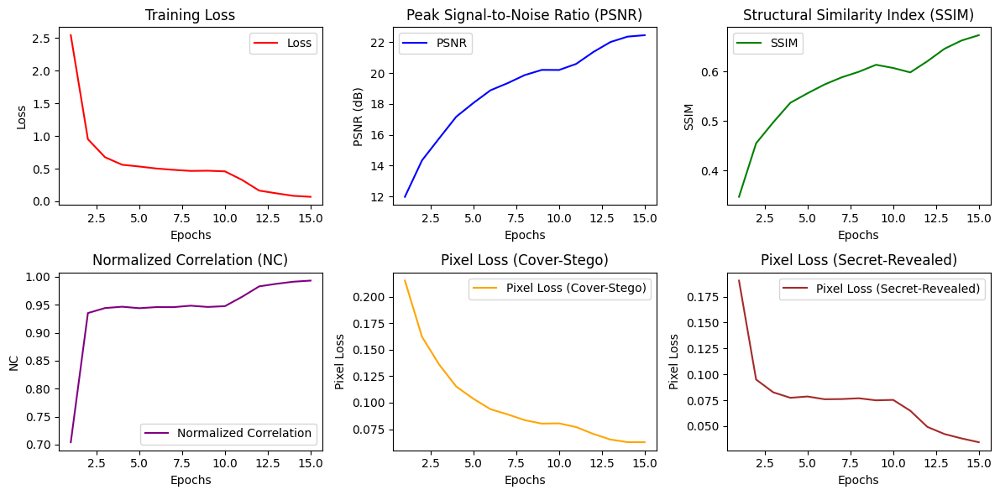


Final Evaluation Metrics:
Final Loss: 0.0688
Final PSNR: 22.4646 dB
Final SSIM: 0.6736
Final Normalized Correlation (NC): 0.9933
Final Pixel Loss (Cover-Stego): 0.0627
Final Pixel Loss (Secret-Revealed): 0.0344



In [20]:
plot_metrics(train_metrics)

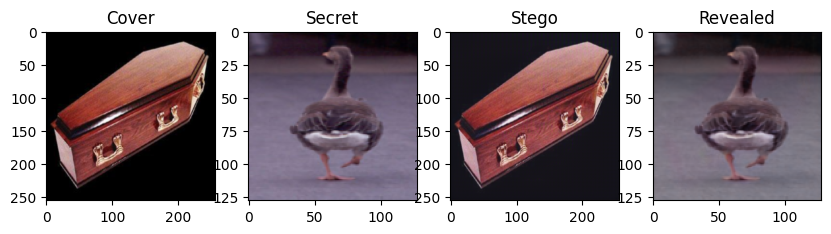

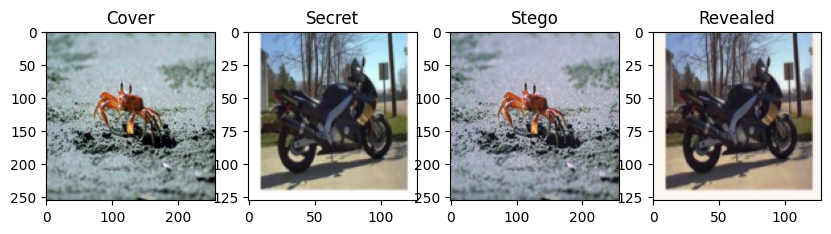

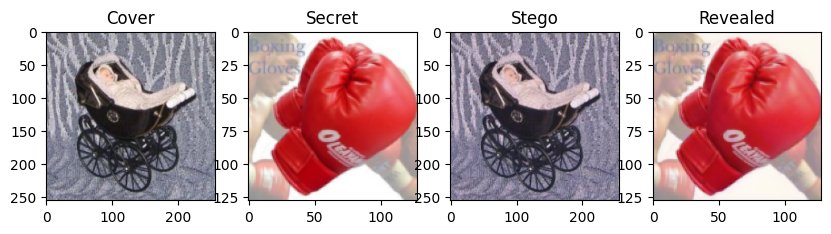

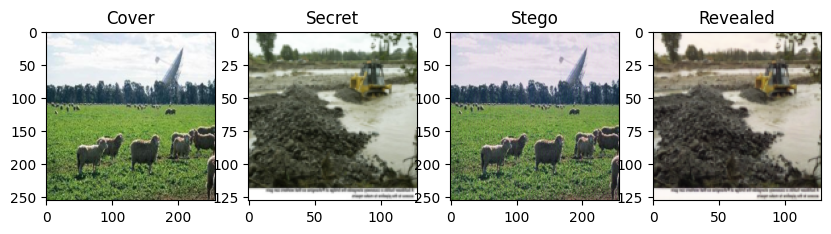

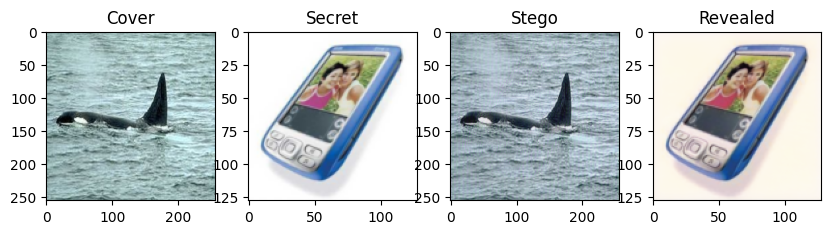

...

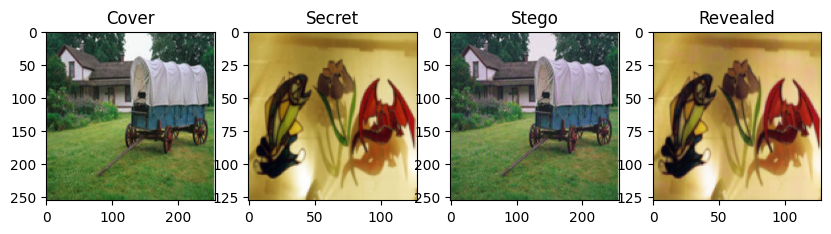

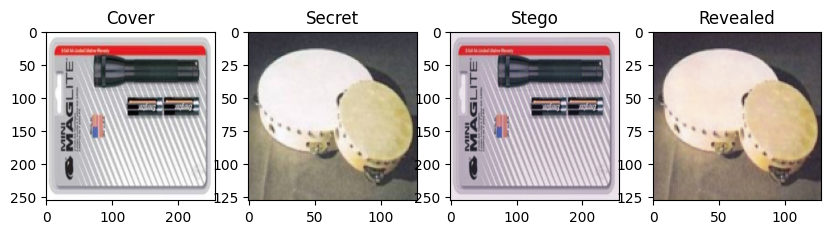

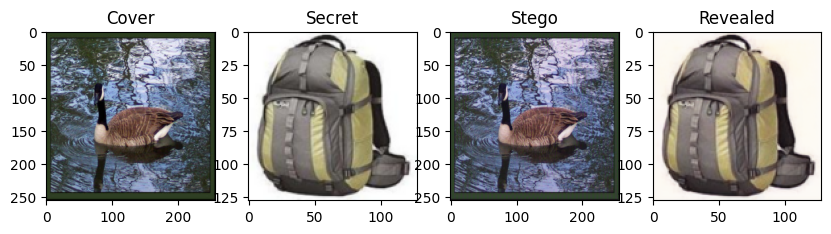

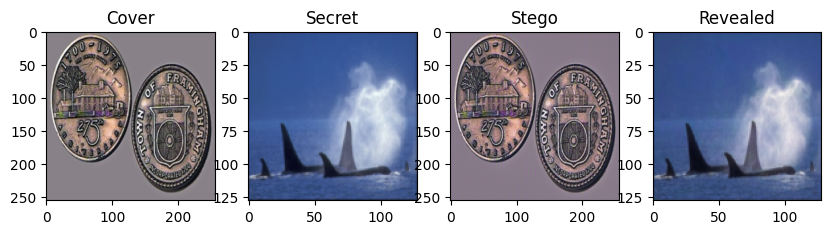

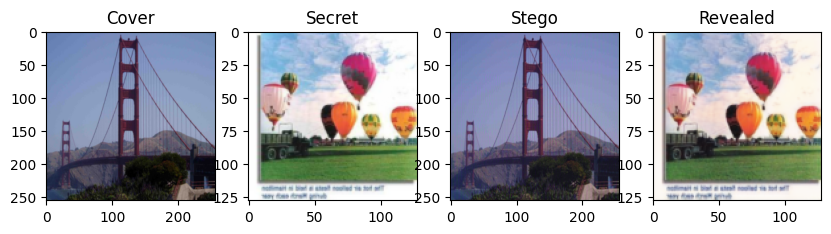


Test Results (Attacks: None): Loss: 0.0051, PSNR: 24.0292, SSIM: 0.6773, NC: 0.9959, Pixel Loss (Cover-Stego): 0.0502, Pixel Loss (Secret-Revealed): 0.0250



In [17]:
test_metrics = test(prep_net=prep_net,
               hide_net=hide_net,
               reveal_net=reveal_net,
               dataloader=test_loader,
               beta = 1,
               visualize = 2,
               attacks=None,                  
               device=device)

In [18]:
torch.save(prep_net.state_dict(), "/kaggle/working/prep_net.pth")
torch.save(hide_net.state_dict(), "/kaggle/working/hide_net.pth")
torch.save(reveal_net.state_dict(), "/kaggle/working/reveal_net.pth")

In [19]:
# 5-Epochs of Full Dataset training @ beta=1, NO ATTACKS
# 10-Epochs of 10% Dataset training @ beta=0.8, NO ATTACKS